In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
# Cell 0: Fast Install for PyTorch Geometric
import torch

def format_pytorch_version(version):
    return version.split('+')[0]

def format_cuda_version(version):
    return 'cu' + version.replace('.', '')

TORCH_VERSION = format_pytorch_version(torch.__version__)
CUDA_VERSION = torch.version.cuda
CUDA = format_cuda_version(CUDA_VERSION) if CUDA_VERSION else 'cpu'

print(f"🔥 Detected PyTorch: {TORCH_VERSION} | CUDA: {CUDA}")

# Install the correct wheels for this specific environment
!pip install torch-scatter -f https://data.pyg.org/whl/torch-{TORCH_VERSION}+{CUDA}.html
!pip install torch-sparse -f https://data.pyg.org/whl/torch-{TORCH_VERSION}+{CUDA}.html
!pip install torch-geometric

print("✅ PyTorch Geometric installed successfully!")

🔥 Detected PyTorch: 2.8.0 | CUDA: cu126
Looking in links: https://data.pyg.org/whl/torch-2.8.0+cu126.html
Looking in links: https://data.pyg.org/whl/torch-2.8.0+cu126.html
✅ PyTorch Geometric installed successfully!


In [2]:
# Cell 1: Core imports & config for DenseNet + GAT

import os, random
from glob import glob

import cv2
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, cohen_kappa_score, confusion_matrix, classification_report

import matplotlib.pyplot as plt
import seaborn as sns

import albumentations as A
from albumentations.pytorch import ToTensorV2

import timm
from torch_geometric.nn import GATConv   # 👈 core of GAT

print("✅ Libraries imported.")


/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

✅ Libraries imported.


In [3]:
# Cell 2: Config & seed

class CFG:
    IMG_SIZE     = 224
    BATCH_SIZE   = 16
    EPOCHS       = 25
    LR           = 1e-4
    NUM_CLASSES  = 5
    N_FOLDS      = 3
    DEVICE       = "cuda" if torch.cuda.is_available() else "cpu"
    SEED         = 42
    TEST_SIZE    = 0.15
    EARLY_STOP   = 5

def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(CFG.SEED)
print("✅ Config ready. Device:", CFG.DEVICE)


✅ Config ready. Device: cuda


In [4]:
# Cell 3: Build dataframe & split into train_val / test

data_dir = "/kaggle/input/ultrasound-dataset/Dataset"

class_map = {"F0":0, "F1":1, "F2":2, "F3":3, "F4":4}

image_paths, labels = [], []
for cname, cid in class_map.items():
    folder = os.path.join(data_dir, cname)
    if not os.path.isdir(folder):
        print("⚠️ Missing folder:", folder)
        continue
    imgs = []
    for ext in ["*.png", "*.jpg", "*.jpeg"]:
        imgs.extend(glob(os.path.join(folder, ext)))
    for p in imgs:
        image_paths.append(p)
        labels.append(cid)
    print(f"  {cname}: {len(imgs)} images")

df = pd.DataFrame({"image_path": image_paths, "diagnosis": labels})
df = df.sample(frac=1, random_state=CFG.SEED).reset_index(drop=True)

print("\nTotal images:", len(df))
print(df["diagnosis"].value_counts().sort_index())

# --- stratified hold-out TEST (realistic evaluation)
train_val_df, test_df = train_test_split(
    df,
    test_size=CFG.TEST_SIZE,
    stratify=df["diagnosis"],
    random_state=CFG.SEED
)

train_val_df = train_val_df.reset_index(drop=True)
test_df      = test_df.reset_index(drop=True)

print("\n✅ Split:")
print("train_val_df:", len(train_val_df))
print("test_df     :", len(test_df))
print("\nTest set class counts:")
print(test_df["diagnosis"].value_counts().sort_index())


  F0: 2114 images
  F1: 861 images
  F2: 793 images
  F3: 857 images
  F4: 1698 images

Total images: 6323
diagnosis
0    2114
1     861
2     793
3     857
4    1698
Name: count, dtype: int64

✅ Split:
train_val_df: 5374
test_df     : 949

Test set class counts:
diagnosis
0    317
1    129
2    119
3    129
4    255
Name: count, dtype: int64


In [ ]:
# Cell 4: CLAHE + sharpen preprocessing

def clahe_equalized(img_rgb):
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l_clahe = clahe.apply(l)
    lab_clahe = cv2.merge((l_clahe, a, b))
    return cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB)

def sharpen(img):
    kernel = np.array([[-1,-1,-1],
                       [-1, 9,-1],
                       [-1,-1,-1]])
    return cv2.filter2D(img, -1, kernel)

def preprocess_for_model(path):
    img = cv2.imread(path)
    if img is None:
        return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.medianBlur(img, 3)
    img = clahe_equalized(img)
    img = sharpen(img)
    return img

print("✅ Preprocessing functions ready.")


✅ Preprocessing functions ready.


In [7]:
# Cell 5: Albumentations & Dataset

train_tfms = A.Compose([
    A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
    A.Affine(scale=(0.9, 1.1),
             translate_percent=(0.06, 0.06),
             rotate=(-20, 20),
             p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),
    A.RandomBrightnessContrast(p=0.6),
    A.CoarseDropout(
        num_holes_range=(1, 8),
        hole_height_range=(4, CFG.IMG_SIZE//14),
        hole_width_range=(4, CFG.IMG_SIZE//14),
        p=0.4
    ),
    A.Normalize(mean=(0.485,0.456,0.406),
                std=(0.229,0.224,0.225)),
    ToTensorV2()
])

valid_tfms = A.Compose([
    A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
    A.Normalize(mean=(0.485,0.456,0.406),
                std=(0.229,0.224,0.225)),
    ToTensorV2()
])

class LiverDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = preprocess_for_model(row.image_path)
        if img is None:
            img = np.zeros((CFG.IMG_SIZE, CFG.IMG_SIZE, 3), dtype=np.uint8)
        if self.transform:
            img = self.transform(image=img)["image"]
        label = torch.tensor(row.diagnosis, dtype=torch.long)
        return img, label

print("✅ Dataset & transforms defined.")


✅ Dataset & transforms defined.


In [8]:
# Cell 6: Focal Loss + WeightedRandomSampler

class FocalLoss(nn.Module):
    def __init__(self, alpha=1.0, gamma=2.0, reduction='mean'):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        ce = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-ce)
        loss = self.alpha * (1-pt)**self.gamma * ce
        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        return loss

def get_sampler(df):
    counts = df["diagnosis"].value_counts().sort_index().values
    class_weights = 1.0 / counts
    sample_weights = [class_weights[y] for y in df["diagnosis"]]
    sample_weights = torch.DoubleTensor(sample_weights)
    sampler = WeightedRandomSampler(sample_weights,
                                    num_samples=len(sample_weights),
                                    replacement=True)
    return sampler

print("✅ FocalLoss & sampler ready.")


✅ FocalLoss & sampler ready.


In [9]:
# Cell 7: KNN graph + DenseNet121 + GAT

from torch_geometric.nn import GATConv

def build_knn_graph(feature_map, k=8):
    """
    feature_map: [C, H, W] for a single sample
    returns: node_feats [N, C], edge_index [2, E]
    """
    C, H, W = feature_map.shape
    N = H * W
    node_feats = feature_map.view(C, N).permute(1, 0)   # [N, C]

    with torch.no_grad():
        dist = torch.cdist(node_feats, node_feats)
        _, knn_idx = dist.topk(k=k, largest=False)

    src = torch.arange(N, device=feature_map.device).view(-1,1).repeat(1,k).reshape(-1)
    dst = knn_idx.reshape(-1)
    edge_index = torch.stack([src, dst], dim=0)
    return node_feats, edge_index


class DenseNet_GAT(nn.Module):
    def __init__(self, num_classes=5, k=8, heads=4):
        super().__init__()
        self.k = k

        # DenseNet backbone: final feature map only
        self.backbone = timm.create_model(
            "densenet121",
            pretrained=True,
            features_only=True,
            out_indices=[-1]   # last feature map
        )

        dummy = torch.zeros(1, 3, CFG.IMG_SIZE, CFG.IMG_SIZE)
        with torch.no_grad():
            feat = self.backbone(dummy)[0]
        self.feat_channels = feat.shape[1]
        print("Backbone channels:", self.feat_channels)

        # GAT layers
        self.gat1 = GATConv(self.feat_channels, 256, heads=heads, concat=True)   # → 256*heads
        self.gat2 = GATConv(256*heads, 256, heads=1, concat=False)

        self.dropout = nn.Dropout(0.3)
        self.fc = nn.Linear(256, num_classes)

    def forward(self, x):
        feats = self.backbone(x)[0]       # [B, C, H, W]
        B, C, H, W = feats.shape
        batch_embeds = []

        for b in range(B):
            fmap = feats[b]              # [C, H, W]
            nodes, edge_index = build_knn_graph(fmap, k=self.k)  # [N, C], [2, E]

            h = F.elu(self.gat1(nodes, edge_index))
            h = self.dropout(h)
            h = F.elu(self.gat2(h, edge_index))

            h = h.mean(dim=0)            # global mean pool over N
            batch_embeds.append(h)

        batch_embeds = torch.stack(batch_embeds, dim=0)  # [B, 256]
        out = self.fc(batch_embeds)
        return out

print("✅ DenseNet_GAT model defined.")


✅ DenseNet_GAT model defined.


In [10]:
# Cell 8: Training loop – DenseNet121 + GAT with tqdm progress bars

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import cohen_kappa_score
from tqdm import tqdm

# ---- Safety defaults (if not already set) ----
if not hasattr(CFG, "EPOCHS"):
    CFG.EPOCHS = 25
if not hasattr(CFG, "N_FOLDS"):
    CFG.N_FOLDS = 3
if not hasattr(CFG, "EARLY_STOPPING_PATIENCE"):
    CFG.EARLY_STOPPING_PATIENCE = 5

print(f"🚀 Starting {CFG.N_FOLDS}-fold training: DenseNet121 + GAT")
print(f"   Total train_val samples: {len(train_val_df)}")

# ---- 1. One-epoch training function ----
def train_one_epoch(model, loader, optimizer, criterion, device, fold, epoch, n_epochs):
    model.train()
    running_loss = 0.0
    all_preds = []
    all_labels = []

    pbar = tqdm(loader, desc=f"[Fold {fold}] Train {epoch+1}/{n_epochs}", leave=False)

    for images, labels in pbar:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)              # [B, num_classes]
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        all_preds.extend(preds.detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())

        pbar.set_postfix({"batch_loss": f"{loss.item():.4f}"})

    epoch_loss = running_loss / len(loader.dataset)
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    epoch_acc = (all_preds == all_labels).mean()

    return epoch_loss, epoch_acc


# ---- 2. One-epoch validation function ----
def valid_one_epoch(model, loader, criterion, device, fold, epoch, n_epochs):
    model.eval()
    running_loss = 0.0
    all_preds = []
    all_labels = []

    pbar = tqdm(loader, desc=f"[Fold {fold}] Valid {epoch+1}/{n_epochs}", leave=False)

    with torch.no_grad():
        for images, labels in pbar:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.detach().cpu().numpy())
            all_labels.extend(labels.detach().cpu().numpy())

            pbar.set_postfix({"batch_loss": f"{loss.item():.4f}"})

    epoch_loss = running_loss / len(loader.dataset)
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    epoch_acc = (all_preds == all_labels).mean()
    epoch_qwk = cohen_kappa_score(all_labels, all_preds, weights="quadratic")

    return epoch_loss, epoch_acc, epoch_qwk


# ---- 3. K-fold training ----
skf = StratifiedKFold(
    n_splits=CFG.N_FOLDS,
    shuffle=True,
    random_state=CFG.SEED
)

fold_results = []

for fold, (train_idx, val_idx) in enumerate(
    skf.split(train_val_df, train_val_df["diagnosis"]), start=1
):
    print(f"\n================ Fold {fold}/{CFG.N_FOLDS} ================")

    # Split data
    train_df = train_val_df.iloc[train_idx].reset_index(drop=True)
    val_df   = train_val_df.iloc[val_idx].reset_index(drop=True)

    print(f"   Train: {len(train_df)}  |  Val: {len(val_df)}")

    # Datasets & loaders
    train_ds = LiverDataset(train_df, transform=train_tfms)
    val_ds   = LiverDataset(val_df,   transform=valid_tfms)

    train_loader = DataLoader(
        train_ds,
        batch_size=CFG.BATCH_SIZE,
        shuffle=True,
        num_workers=2,
        pin_memory=True
    )
    val_loader = DataLoader(
        val_ds,
        batch_size=CFG.BATCH_SIZE,
        shuffle=False,
        num_workers=2,
        pin_memory=True
    )

    # Model, optimizer, loss, scheduler
    model = DenseNet_GAT(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)
    optimizer = torch.optim.AdamW(model.parameters(), lr=CFG.LR, weight_decay=1e-4)
    criterion = nn.CrossEntropyLoss()
    
    # FIX: Removed verbose=True
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", factor=0.5, patience=3
    )

    best_qwk = -1.0
    no_improve = 0
    best_model_path = f"densgat_fold{fold}_best.pth"

    for epoch in range(CFG.EPOCHS):
        train_loss, train_acc = train_one_epoch(
            model, train_loader, optimizer, criterion,
            CFG.DEVICE, fold, epoch, CFG.EPOCHS
        )

        val_loss, val_acc, val_qwk = valid_one_epoch(
            model, val_loader, criterion,
            CFG.DEVICE, fold, epoch, CFG.EPOCHS
        )

        # Scheduler on QWK (quality of ordinal agreement)
        scheduler.step(val_qwk)

        # Get current LR safely for printing
        current_lr = optimizer.param_groups[0]['lr']

        print(
            f"Epoch {epoch+1:02d}: "
            f"Train L {train_loss:.4f} A {train_acc:.4f} | "
            f"Val L {val_loss:.4f} A {val_acc:.4f} QWK {val_qwk:.4f} | LR {current_lr:.1e}"
        )

        # Save best model per fold
        if val_qwk > best_qwk + 1e-5:
            best_qwk = val_qwk
            no_improve = 0
            torch.save(model.state_dict(), best_model_path)
            print(f"  ✅ Saved best model for fold {fold} (QWK={best_qwk:.4f}) → {best_model_path}")
        else:
            no_improve += 1
            print(f"  ⏳ No improvement for {no_improve} epoch(s)")

        # Early stopping
        if no_improve >= CFG.EARLY_STOPPING_PATIENCE:
            print(f"  ⛔ Early stopping on fold {fold} at epoch {epoch+1}")
            break

    fold_results.append({"fold": fold, "best_qwk": best_qwk})
    print(f"✅ Fold {fold} finished. Best QWK: {best_qwk:.4f}")

# ---- 4. Summary over folds ----
results_df = pd.DataFrame(fold_results)
print("\n✅ All folds finished.")
print(results_df)
print(f"Mean QWK: {results_df['best_qwk'].mean():.4f}")

🚀 Starting 3-fold training: DenseNet121 + GAT
   Total train_val samples: 5374

================ Fold 1/3 ================
   Train: 3582  |  Val: 1792
Backbone channels: 1024


Epoch 01: Train L 1.0564 A 0.5246 | Val L 0.7866 A 0.6892 QWK 0.7910 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.7910) → densgat_fold1_best.pth


Epoch 02: Train L 0.8085 A 0.6415 | Val L 0.6195 A 0.7344 QWK 0.8353 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.8353) → densgat_fold1_best.pth


Epoch 03: Train L 0.6632 A 0.7175 | Val L 0.5067 A 0.7913 QWK 0.8985 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.8985) → densgat_fold1_best.pth


Epoch 04: Train L 0.5858 A 0.7465 | Val L 0.4587 A 0.8119 QWK 0.8973 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 05: Train L 0.5103 A 0.7834 | Val L 0.3532 A 0.8588 QWK 0.9180 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.9180) → densgat_fold1_best.pth


Epoch 06: Train L 0.4475 A 0.8132 | Val L 0.3267 A 0.8655 QWK 0.9264 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.9264) → densgat_fold1_best.pth


Epoch 07: Train L 0.4109 A 0.8303 | Val L 0.2887 A 0.8901 QWK 0.9562 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.9562) → densgat_fold1_best.pth


Epoch 08: Train L 0.3475 A 0.8624 | Val L 0.2403 A 0.9146 QWK 0.9583 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.9583) → densgat_fold1_best.pth


Epoch 09: Train L 0.3074 A 0.8797 | Val L 0.2553 A 0.9085 QWK 0.9661 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.9661) → densgat_fold1_best.pth


Epoch 10: Train L 0.3180 A 0.8744 | Val L 0.2699 A 0.8968 QWK 0.9531 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 11: Train L 0.2736 A 0.8970 | Val L 0.2045 A 0.9196 QWK 0.9698 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.9698) → densgat_fold1_best.pth


Epoch 12: Train L 0.2549 A 0.9068 | Val L 0.2167 A 0.9258 QWK 0.9619 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 13: Train L 0.2019 A 0.9213 | Val L 0.1818 A 0.9408 QWK 0.9746 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.9746) → densgat_fold1_best.pth


Epoch 14: Train L 0.2181 A 0.9174 | Val L 0.1542 A 0.9503 QWK 0.9823 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.9823) → densgat_fold1_best.pth


Epoch 15: Train L 0.1983 A 0.9277 | Val L 0.1442 A 0.9559 QWK 0.9828 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.9828) → densgat_fold1_best.pth


Epoch 16: Train L 0.1663 A 0.9386 | Val L 0.2304 A 0.9314 QWK 0.9685 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 17: Train L 0.1817 A 0.9310 | Val L 0.2019 A 0.9425 QWK 0.9743 | LR 1.0e-04
  ⏳ No improvement for 2 epoch(s)


Epoch 18: Train L 0.1620 A 0.9377 | Val L 0.1500 A 0.9570 QWK 0.9809 | LR 1.0e-04
  ⏳ No improvement for 3 epoch(s)


Epoch 19: Train L 0.1408 A 0.9503 | Val L 0.1561 A 0.9548 QWK 0.9853 | LR 1.0e-04
  ✅ Saved best model for fold 1 (QWK=0.9853) → densgat_fold1_best.pth


Epoch 20: Train L 0.1224 A 0.9556 | Val L 0.2189 A 0.9414 QWK 0.9791 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 21: Train L 0.1685 A 0.9408 | Val L 0.1595 A 0.9503 QWK 0.9796 | LR 1.0e-04
  ⏳ No improvement for 2 epoch(s)


Epoch 22: Train L 0.1187 A 0.9581 | Val L 0.2041 A 0.9542 QWK 0.9817 | LR 1.0e-04
  ⏳ No improvement for 3 epoch(s)


Epoch 23: Train L 0.1122 A 0.9570 | Val L 0.1944 A 0.9526 QWK 0.9815 | LR 5.0e-05
  ⏳ No improvement for 4 epoch(s)


Epoch 24: Train L 0.0904 A 0.9685 | Val L 0.1193 A 0.9738 QWK 0.9898 | LR 5.0e-05
  ✅ Saved best model for fold 1 (QWK=0.9898) → densgat_fold1_best.pth


Epoch 25: Train L 0.0707 A 0.9793 | Val L 0.1291 A 0.9754 QWK 0.9905 | LR 5.0e-05
  ✅ Saved best model for fold 1 (QWK=0.9905) → densgat_fold1_best.pth
✅ Fold 1 finished. Best QWK: 0.9905

================ Fold 2/3 ================
   Train: 3583  |  Val: 1791
Backbone channels: 1024


Epoch 01: Train L 1.0473 A 0.5350 | Val L 0.9651 A 0.5717 QWK 0.5893 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.5893) → densgat_fold2_best.pth


Epoch 02: Train L 0.8127 A 0.6517 | Val L 0.6423 A 0.7337 QWK 0.8598 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.8598) → densgat_fold2_best.pth


Epoch 03: Train L 0.6891 A 0.7178 | Val L 0.5182 A 0.7677 QWK 0.8438 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 04: Train L 0.5964 A 0.7555 | Val L 0.4748 A 0.7962 QWK 0.8933 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.8933) → densgat_fold2_best.pth


Epoch 05: Train L 0.5313 A 0.7865 | Val L 0.4274 A 0.8336 QWK 0.8964 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.8964) → densgat_fold2_best.pth


Epoch 06: Train L 0.4464 A 0.8228 | Val L 0.3478 A 0.8537 QWK 0.9289 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.9289) → densgat_fold2_best.pth


Epoch 07: Train L 0.4113 A 0.8348 | Val L 0.3213 A 0.8710 QWK 0.9320 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.9320) → densgat_fold2_best.pth


Epoch 08: Train L 0.3739 A 0.8521 | Val L 0.3297 A 0.8755 QWK 0.9286 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 09: Train L 0.3341 A 0.8713 | Val L 0.3363 A 0.8783 QWK 0.9400 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.9400) → densgat_fold2_best.pth


Epoch 10: Train L 0.3094 A 0.8831 | Val L 0.2648 A 0.9006 QWK 0.9468 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.9468) → densgat_fold2_best.pth


Epoch 11: Train L 0.2916 A 0.8959 | Val L 0.2812 A 0.9068 QWK 0.9518 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.9518) → densgat_fold2_best.pth


Epoch 12: Train L 0.2670 A 0.8992 | Val L 0.1800 A 0.9274 QWK 0.9726 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.9726) → densgat_fold2_best.pth


Epoch 13: Train L 0.2204 A 0.9174 | Val L 0.2251 A 0.9174 QWK 0.9707 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 14: Train L 0.2136 A 0.9238 | Val L 0.2297 A 0.9213 QWK 0.9706 | LR 1.0e-04
  ⏳ No improvement for 2 epoch(s)


Epoch 15: Train L 0.1881 A 0.9297 | Val L 0.1820 A 0.9458 QWK 0.9786 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.9786) → densgat_fold2_best.pth


Epoch 16: Train L 0.2120 A 0.9213 | Val L 0.1933 A 0.9369 QWK 0.9623 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 17: Train L 0.1732 A 0.9341 | Val L 0.1976 A 0.9419 QWK 0.9793 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.9793) → densgat_fold2_best.pth


Epoch 18: Train L 0.1602 A 0.9447 | Val L 0.1788 A 0.9486 QWK 0.9793 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 19: Train L 0.1575 A 0.9406 | Val L 0.1655 A 0.9470 QWK 0.9819 | LR 1.0e-04
  ✅ Saved best model for fold 2 (QWK=0.9819) → densgat_fold2_best.pth


Epoch 20: Train L 0.1506 A 0.9431 | Val L 0.1645 A 0.9503 QWK 0.9707 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 21: Train L 0.1568 A 0.9459 | Val L 0.1807 A 0.9470 QWK 0.9769 | LR 1.0e-04
  ⏳ No improvement for 2 epoch(s)


Epoch 22: Train L 0.1191 A 0.9545 | Val L 0.2027 A 0.9486 QWK 0.9791 | LR 1.0e-04
  ⏳ No improvement for 3 epoch(s)


Epoch 23: Train L 0.1080 A 0.9623 | Val L 0.1720 A 0.9475 QWK 0.9798 | LR 5.0e-05
  ⏳ No improvement for 4 epoch(s)


Epoch 24: Train L 0.0687 A 0.9752 | Val L 0.1552 A 0.9548 QWK 0.9790 | LR 5.0e-05
  ⏳ No improvement for 5 epoch(s)
  ⛔ Early stopping on fold 2 at epoch 24
✅ Fold 2 finished. Best QWK: 0.9819

================ Fold 3/3 ================
   Train: 3583  |  Val: 1791
Backbone channels: 1024


Epoch 01: Train L 1.0280 A 0.5484 | Val L 0.7591 A 0.6454 QWK 0.7508 | LR 1.0e-04
  ✅ Saved best model for fold 3 (QWK=0.7508) → densgat_fold3_best.pth


Epoch 02: Train L 0.8068 A 0.6509 | Val L 0.6387 A 0.7197 QWK 0.8652 | LR 1.0e-04
  ✅ Saved best model for fold 3 (QWK=0.8652) → densgat_fold3_best.pth


Epoch 03: Train L 0.6627 A 0.7162 | Val L 0.5331 A 0.7901 QWK 0.8634 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 04: Train L 0.5826 A 0.7600 | Val L 0.5170 A 0.7884 QWK 0.8446 | LR 1.0e-04
  ⏳ No improvement for 2 epoch(s)


Epoch 05: Train L 0.5283 A 0.7840 | Val L 0.5414 A 0.7839 QWK 0.8756 | LR 1.0e-04
  ✅ Saved best model for fold 3 (QWK=0.8756) → densgat_fold3_best.pth


Epoch 06: Train L 0.4685 A 0.8074 | Val L 0.3520 A 0.8509 QWK 0.9304 | LR 1.0e-04
  ✅ Saved best model for fold 3 (QWK=0.9304) → densgat_fold3_best.pth


Epoch 07: Train L 0.4135 A 0.8278 | Val L 0.3509 A 0.8582 QWK 0.9306 | LR 1.0e-04
  ✅ Saved best model for fold 3 (QWK=0.9306) → densgat_fold3_best.pth


Epoch 08: Train L 0.4037 A 0.8359 | Val L 0.2633 A 0.8989 QWK 0.9491 | LR 1.0e-04
  ✅ Saved best model for fold 3 (QWK=0.9491) → densgat_fold3_best.pth


Epoch 09: Train L 0.3259 A 0.8722 | Val L 0.2887 A 0.8922 QWK 0.9462 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 10: Train L 0.3019 A 0.8892 | Val L 0.2165 A 0.9274 QWK 0.9748 | LR 1.0e-04
  ✅ Saved best model for fold 3 (QWK=0.9748) → densgat_fold3_best.pth


Epoch 11: Train L 0.2810 A 0.8903 | Val L 0.2363 A 0.9202 QWK 0.9637 | LR 1.0e-04
  ⏳ No improvement for 1 epoch(s)


Epoch 12: Train L 0.2607 A 0.8992 | Val L 0.2854 A 0.9017 QWK 0.9527 | LR 1.0e-04
  ⏳ No improvement for 2 epoch(s)


Epoch 13: Train L 0.2269 A 0.9118 | Val L 0.2144 A 0.9207 QWK 0.9575 | LR 1.0e-04
  ⏳ No improvement for 3 epoch(s)


Epoch 14: Train L 0.2237 A 0.9199 | Val L 0.1678 A 0.9425 QWK 0.9664 | LR 5.0e-05
  ⏳ No improvement for 4 epoch(s)


Epoch 15: Train L 0.1467 A 0.9464 | Val L 0.1449 A 0.9520 QWK 0.9756 | LR 5.0e-05
  ✅ Saved best model for fold 3 (QWK=0.9756) → densgat_fold3_best.pth


Epoch 16: Train L 0.1308 A 0.9526 | Val L 0.1321 A 0.9592 QWK 0.9824 | LR 5.0e-05
  ✅ Saved best model for fold 3 (QWK=0.9824) → densgat_fold3_best.pth


Epoch 17: Train L 0.1285 A 0.9576 | Val L 0.1273 A 0.9598 QWK 0.9794 | LR 5.0e-05
  ⏳ No improvement for 1 epoch(s)


Epoch 18: Train L 0.1111 A 0.9570 | Val L 0.1236 A 0.9631 QWK 0.9751 | LR 5.0e-05
  ⏳ No improvement for 2 epoch(s)


Epoch 19: Train L 0.1075 A 0.9601 | Val L 0.1057 A 0.9676 QWK 0.9851 | LR 5.0e-05
  ✅ Saved best model for fold 3 (QWK=0.9851) → densgat_fold3_best.pth


Epoch 20: Train L 0.1005 A 0.9643 | Val L 0.1390 A 0.9626 QWK 0.9839 | LR 5.0e-05
  ⏳ No improvement for 1 epoch(s)


Epoch 21: Train L 0.0968 A 0.9654 | Val L 0.1592 A 0.9537 QWK 0.9765 | LR 5.0e-05
  ⏳ No improvement for 2 epoch(s)


Epoch 22: Train L 0.1100 A 0.9626 | Val L 0.1435 A 0.9576 QWK 0.9841 | LR 5.0e-05
  ⏳ No improvement for 3 epoch(s)


Epoch 23: Train L 0.0873 A 0.9679 | Val L 0.1230 A 0.9659 QWK 0.9887 | LR 5.0e-05
  ✅ Saved best model for fold 3 (QWK=0.9887) → densgat_fold3_best.pth


Epoch 24: Train L 0.0808 A 0.9713 | Val L 0.1218 A 0.9654 QWK 0.9804 | LR 5.0e-05
  ⏳ No improvement for 1 epoch(s)


Epoch 25: Train L 0.0822 A 0.9685 | Val L 0.1185 A 0.9693 QWK 0.9855 | LR 5.0e-05
  ⏳ No improvement for 2 epoch(s)
✅ Fold 3 finished. Best QWK: 0.9887

✅ All folds finished.
   fold  best_qwk
0     1  0.990492
1     2  0.981912
2     3  0.988732
Mean QWK: 0.9870


📌 Generating PER-FOLD (fold-model-on-test) and OVERALL confusion matrices...

🔹 Fold-model 1 on TEST set...
Backbone channels: 1024
✅ Fold 1 TEST Accuracy: 0.9694
✅ Fold 1 TEST QWK:      0.9888


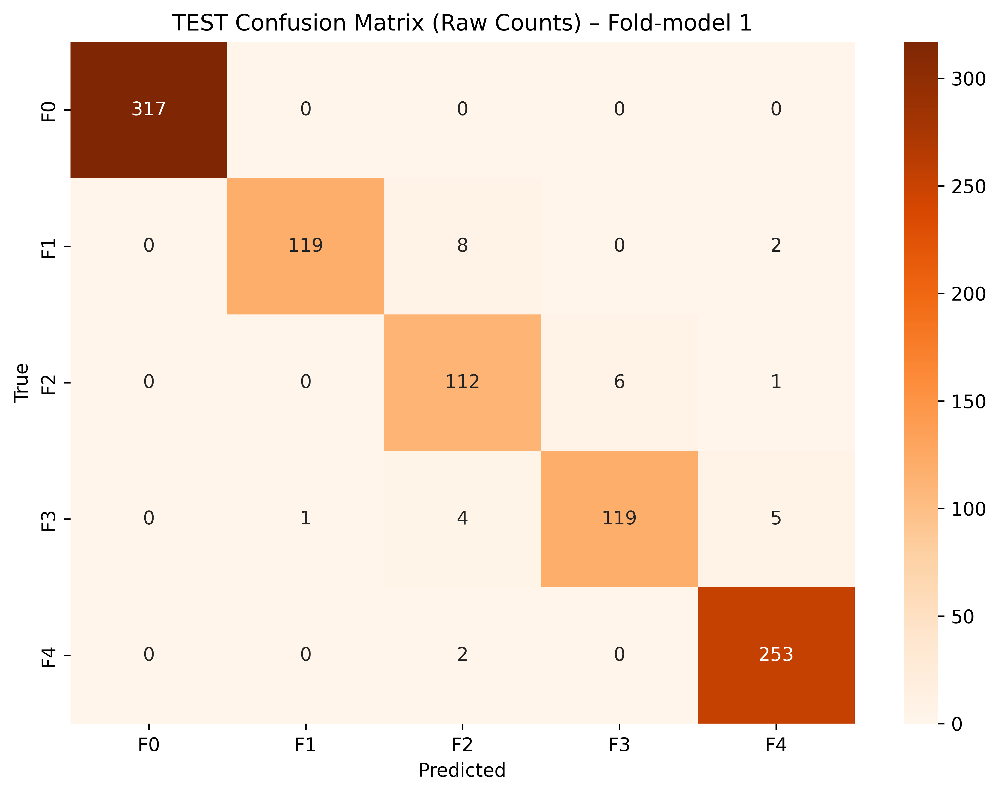

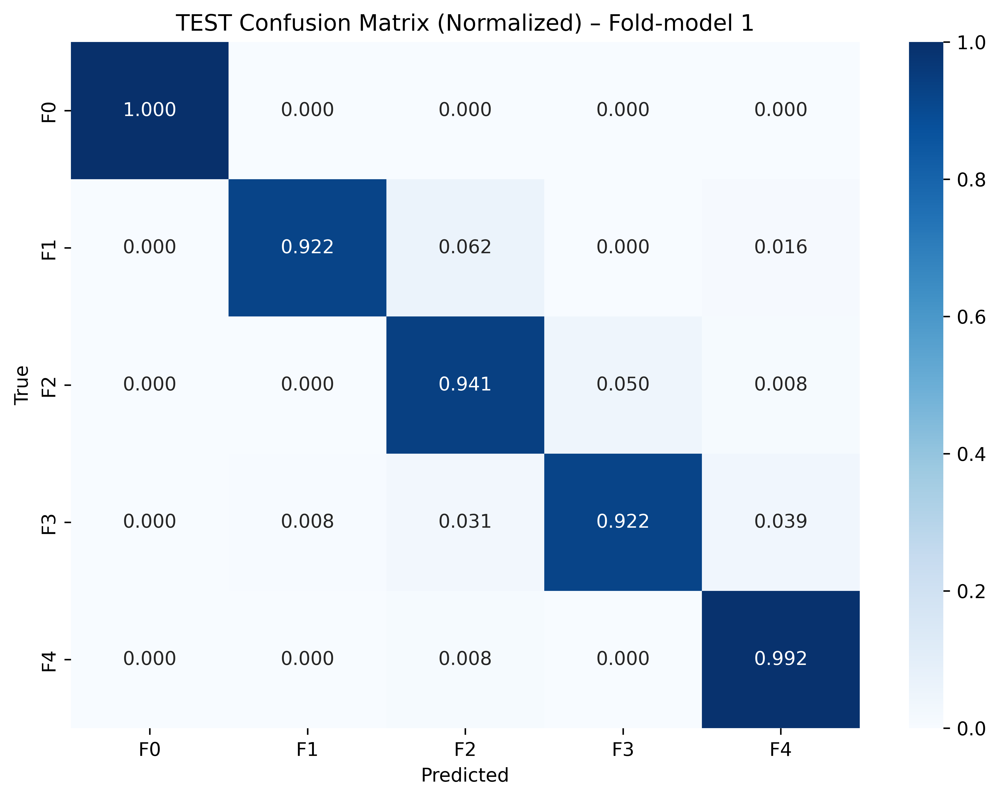


📄 Classification Report (Fold-model 1 on TEST):
              precision    recall  f1-score   support

          F0     1.0000    1.0000    1.0000       317
          F1     0.9917    0.9225    0.9558       129
          F2     0.8889    0.9412    0.9143       119
          F3     0.9520    0.9225    0.9370       129
          F4     0.9693    0.9922    0.9806       255

    accuracy                         0.9694       949
   macro avg     0.9604    0.9557    0.9575       949
weighted avg     0.9702    0.9694    0.9695       949


🔹 Fold-model 2 on TEST set...
Backbone channels: 1024
✅ Fold 2 TEST Accuracy: 0.9526
✅ Fold 2 TEST QWK:      0.9810


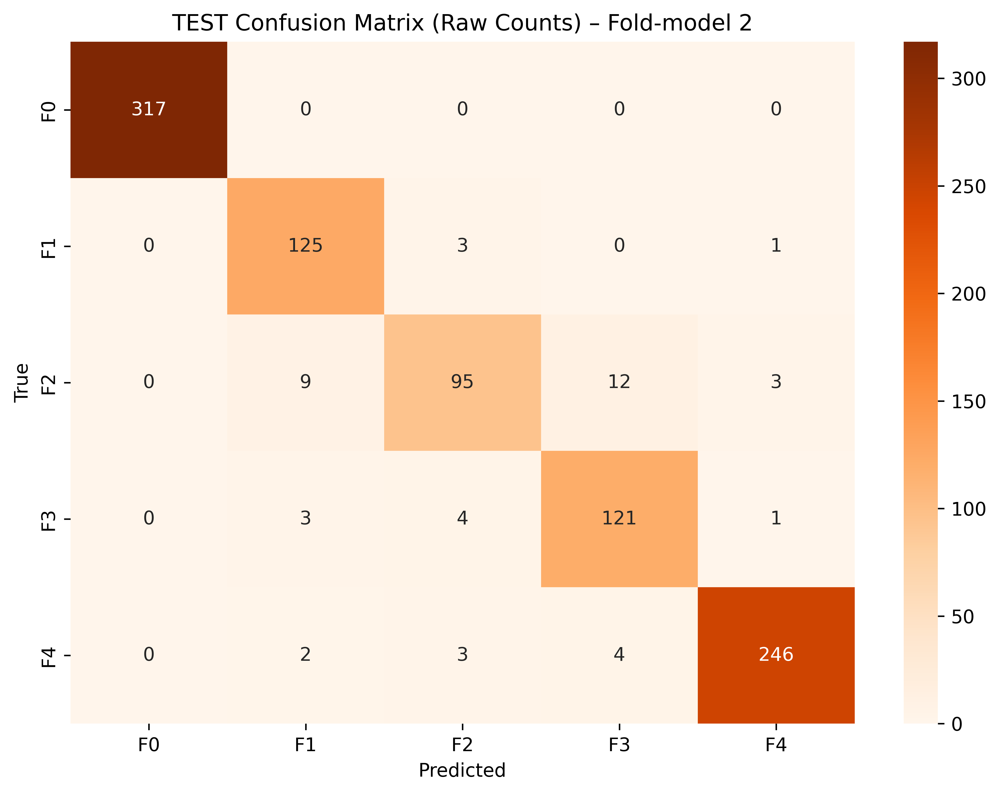

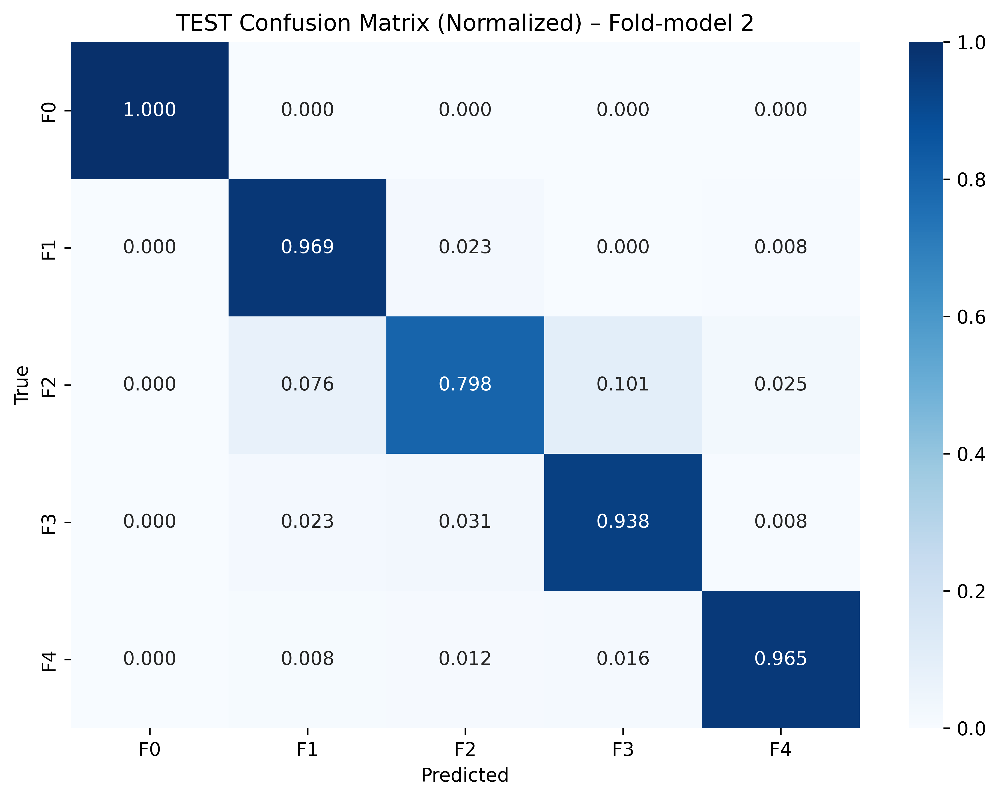


📄 Classification Report (Fold-model 2 on TEST):
              precision    recall  f1-score   support

          F0     1.0000    1.0000    1.0000       317
          F1     0.8993    0.9690    0.9328       129
          F2     0.9048    0.7983    0.8482       119
          F3     0.8832    0.9380    0.9098       129
          F4     0.9801    0.9647    0.9723       255

    accuracy                         0.9526       949
   macro avg     0.9335    0.9340    0.9326       949
weighted avg     0.9531    0.9526    0.9521       949


🔹 Fold-model 3 on TEST set...
Backbone channels: 1024
✅ Fold 3 TEST Accuracy: 0.9610
✅ Fold 3 TEST QWK:      0.9870


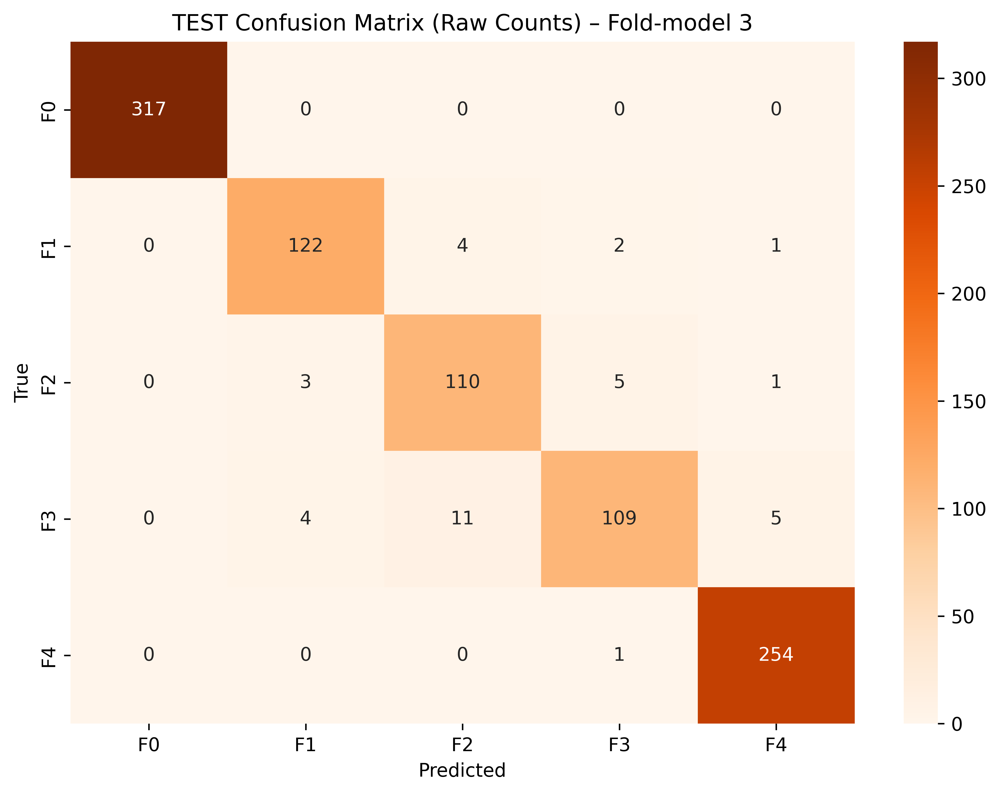

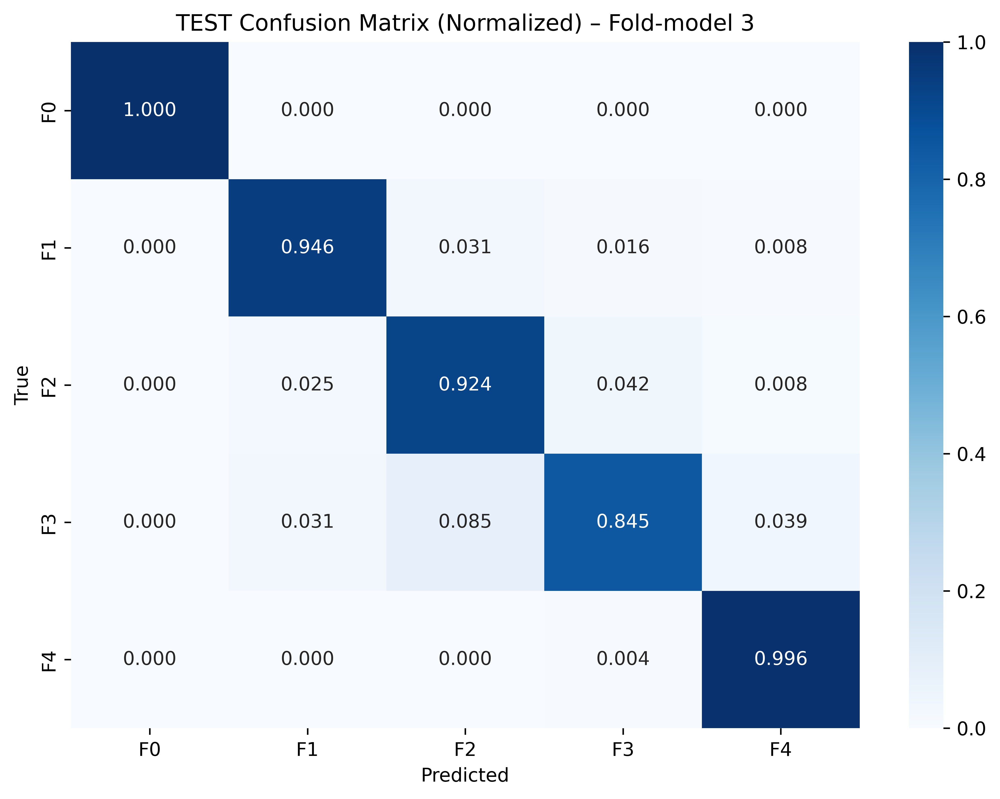


📄 Classification Report (Fold-model 3 on TEST):
              precision    recall  f1-score   support

          F0     1.0000    1.0000    1.0000       317
          F1     0.9457    0.9457    0.9457       129
          F2     0.8800    0.9244    0.9016       119
          F3     0.9316    0.8450    0.8862       129
          F4     0.9732    0.9961    0.9845       255

    accuracy                         0.9610       949
   macro avg     0.9461    0.9422    0.9436       949
weighted avg     0.9611    0.9610    0.9607       949


📊 OVERALL (Aggregated) TEST PERFORMANCE
⚠️ Note: This is NOT an ensemble. Test set is repeated across folds.
✅ Overall Accuracy: 0.9610
✅ Overall QWK:      0.9856


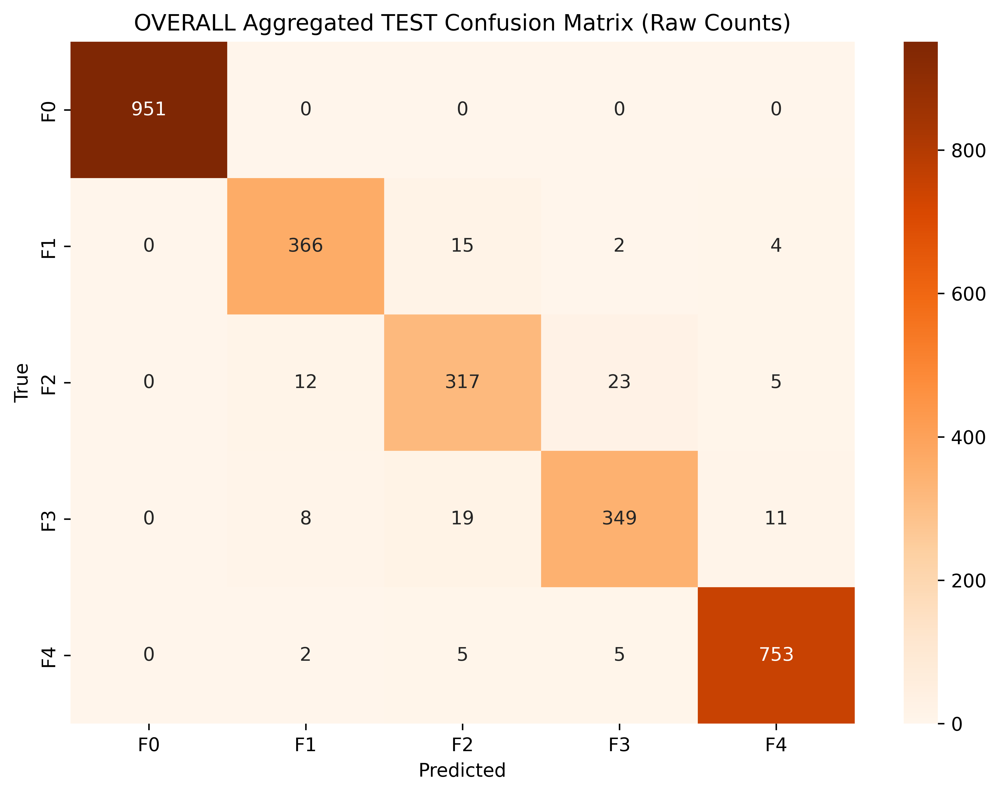

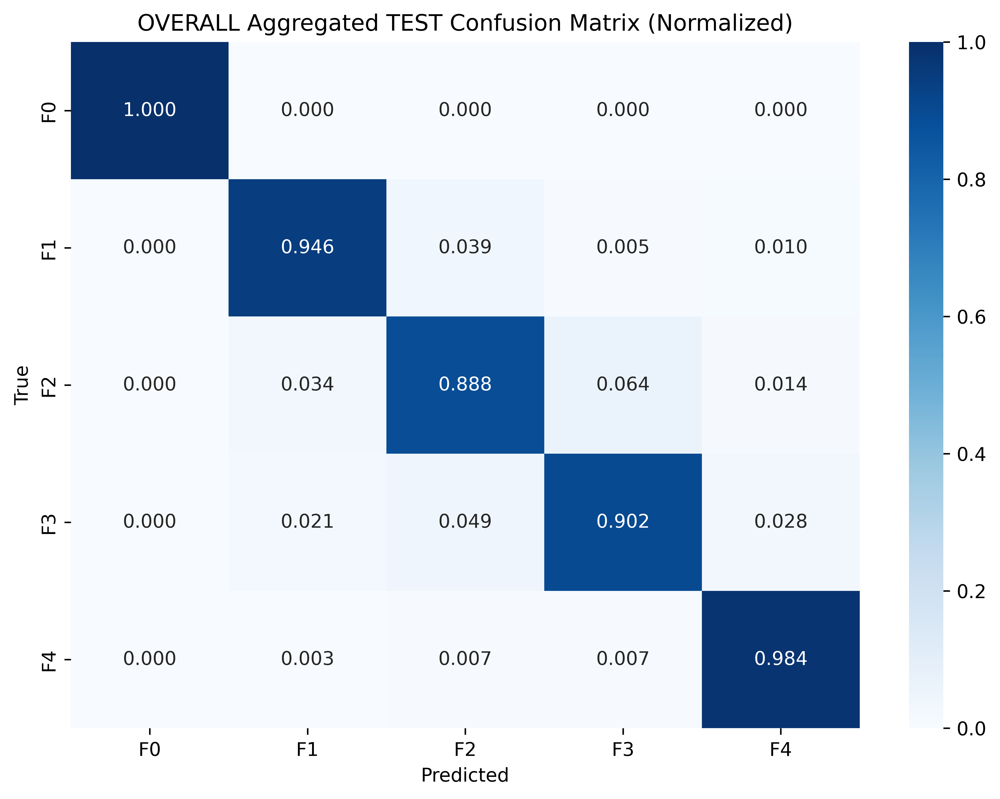


📄 Classification Report (OVERALL aggregated TEST):
              precision    recall  f1-score   support

          F0     1.0000    1.0000    1.0000       951
          F1     0.9433    0.9457    0.9445       387
          F2     0.8904    0.8880    0.8892       357
          F3     0.9208    0.9018    0.9112       387
          F4     0.9741    0.9843    0.9792       765

    accuracy                         0.9610      2847
   macro avg     0.9457    0.9440    0.9448      2847
weighted avg     0.9608    0.9610    0.9609      2847



In [12]:
# ============================
# OPTIONAL: TEST SET RESULTS PER FOLD MODEL + OVERALL (NOT CV VALIDATION)
# DenseNet + GAT
# ============================

import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch.utils.data import DataLoader
from sklearn.metrics import (
    confusion_matrix, classification_report,
    accuracy_score, cohen_kappa_score
)

print("📌 Generating PER-FOLD (fold-model-on-test) and OVERALL confusion matrices...")

# ✅ Correct loader function name
def load_gat_model(path):
    model = DenseNet_GAT(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)
    model.load_state_dict(torch.load(path, map_location=CFG.DEVICE))
    model.eval()
    return model

# ✅ Correct fold paths
fold_paths = [
    "densgat_fold1_best.pth",
    "densgat_fold2_best.pth",
    "densgat_fold3_best.pth"
]

# Optional: warn if any file missing (prevents silent crash)
for p in fold_paths:
    if not os.path.exists(p):
        print(f"⚠️ Missing weight file: {p}")

# TEST loader
test_loader = DataLoader(
    LiverDataset(test_df, transform=valid_tfms),
    batch_size=CFG.BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

class_names = list(class_map.keys()) if "class_map" in globals() else ['F0','F1','F2','F3','F4']

all_true, all_pred = [], []

# ============================
# PER-FOLD MODEL → TEST RESULTS
# ============================
for fold, model_path in enumerate(fold_paths, start=1):

    if not os.path.exists(model_path):
        print(f"\n⚠️ Skipping fold {fold} because file not found: {model_path}")
        continue

    print(f"\n🔹 Fold-model {fold} on TEST set...")
    model = load_gat_model(model_path)

    y_true_fold, y_pred_fold = [], []

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to(CFG.DEVICE)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1).cpu().numpy()

            y_pred_fold.extend(preds)
            y_true_fold.extend(labels.numpy())

    # Metrics per fold-model on test
    fold_acc = accuracy_score(y_true_fold, y_pred_fold)
    fold_qwk = cohen_kappa_score(y_true_fold, y_pred_fold, weights="quadratic")

    print(f"✅ Fold {fold} TEST Accuracy: {fold_acc:.4f}")
    print(f"✅ Fold {fold} TEST QWK:      {fold_qwk:.4f}")

    # Save for overall aggregation (NOTE: this repeats test set 3 times)
    all_true.extend(y_true_fold)
    all_pred.extend(y_pred_fold)

    # Confusion matrices
    cm_raw = confusion_matrix(y_true_fold, y_pred_fold)

    # Raw (orange) — 600 dpi
    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_raw, annot=True, fmt="d", cmap="Oranges",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"TEST Confusion Matrix (Raw Counts) – Fold-model {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    # Normalized (blue) — 600 dpi
    cm_norm = cm_raw.astype(float) / (cm_raw.sum(axis=1, keepdims=True) + 1e-8)
    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_norm, annot=True, fmt=".3f", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"TEST Confusion Matrix (Normalized) – Fold-model {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    print(f"\n📄 Classification Report (Fold-model {fold} on TEST):")
    print(classification_report(y_true_fold, y_pred_fold, target_names=class_names, digits=4))

# ============================
# OVERALL (Aggregated) — NOT ENSEMBLE
# ============================
all_true = np.array(all_true)
all_pred = np.array(all_pred)

if len(all_true) == 0:
    print("\n❌ No predictions were collected. Check your fold model paths.")
else:
    overall_acc = accuracy_score(all_true, all_pred)
    overall_qwk = cohen_kappa_score(all_true, all_pred, weights="quadratic")

    print("\n========================================")
    print("📊 OVERALL (Aggregated) TEST PERFORMANCE")
    print("⚠️ Note: This is NOT an ensemble. Test set is repeated across folds.")
    print(f"✅ Overall Accuracy: {overall_acc:.4f}")
    print(f"✅ Overall QWK:      {overall_qwk:.4f}")
    print("========================================")

    cm_overall = confusion_matrix(all_true, all_pred)

    # Raw overall — 600 dpi
    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_overall, annot=True, fmt="d", cmap="Oranges",
                xticklabels=class_names, yticklabels=class_names)
    plt.title("OVERALL Aggregated TEST Confusion Matrix (Raw Counts)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    # Normalized overall — 600 dpi
    cm_overall_norm = cm_overall.astype(float) / (cm_overall.sum(axis=1, keepdims=True) + 1e-8)
    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_overall_norm, annot=True, fmt=".3f", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title("OVERALL Aggregated TEST Confusion Matrix (Normalized)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    print("\n📄 Classification Report (OVERALL aggregated TEST):")
    print(classification_report(all_true, all_pred, target_names=class_names, digits=4))



🚀 Evaluating MAIN TEST SET (Ensemble) — DenseNet + GAT...
Backbone channels: 1024
Backbone channels: 1024
Backbone channels: 1024

📊 MAIN TEST SET RESULTS (ENSEMBLE) — DenseNet + GAT
✅ Test Accuracy: 0.9905
✅ Test QWK:      0.9982

📄 Classification Report:
              precision    recall  f1-score   support

          F0     1.0000    1.0000    1.0000       317
          F1     0.9773    1.0000    0.9885       129
          F2     0.9826    0.9496    0.9658       119
          F3     0.9767    0.9767    0.9767       129
          F4     0.9961    1.0000    0.9980       255

    accuracy                         0.9905       949
   macro avg     0.9865    0.9853    0.9858       949
weighted avg     0.9905    0.9905    0.9905       949



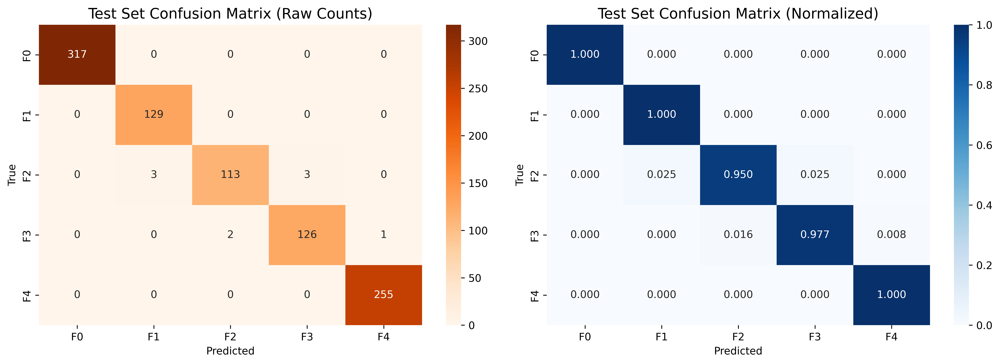

In [13]:
# ============================
# TEST SET EVALUATION (ENSEMBLE) — DenseNet + GAT (600 DPI)
# ============================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from sklearn.metrics import accuracy_score, cohen_kappa_score, confusion_matrix, classification_report
from torch.utils.data import DataLoader

print("\n🚀 Evaluating MAIN TEST SET (Ensemble) — DenseNet + GAT...")

# -------- Load test data --------
test_loader = DataLoader(
    LiverDataset(test_df, transform=valid_tfms),
    batch_size=CFG.BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

# -------- Load ensemble models (GAT) --------
fold_models = [
    "densgat_fold1_best.pth",
    "densgat_fold2_best.pth",
    "densgat_fold3_best.pth"
]

models = []
for path in fold_models:
    model = DenseNet_GAT(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)
    model.load_state_dict(torch.load(path, map_location=CFG.DEVICE))
    model.eval()
    models.append(model)

# -------- Inference (store probs for ROC/AUC) --------
all_labels, all_preds, all_probs = [], [], []

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(CFG.DEVICE)

        # Average softmax probabilities across fold models (soft-voting ensemble)
        probs = torch.zeros((imgs.size(0), CFG.NUM_CLASSES), device=CFG.DEVICE)
        for m in models:
            probs += torch.softmax(m(imgs), dim=1)
        probs /= len(models)

        preds = torch.argmax(probs, dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())
        all_probs.extend(probs.cpu().numpy())  # ✅ for ROC/AUC

# Convert to numpy
all_labels = np.array(all_labels)
all_preds  = np.array(all_preds)
all_probs  = np.array(all_probs)

# -------- Metrics --------
acc = accuracy_score(all_labels, all_preds)
qwk = cohen_kappa_score(all_labels, all_preds, weights="quadratic")

print("\n========================================")
print("📊 MAIN TEST SET RESULTS (ENSEMBLE) — DenseNet + GAT")
print(f"✅ Test Accuracy: {acc:.4f}")
print(f"✅ Test QWK:      {qwk:.4f}")
print("========================================")

print("\n📄 Classification Report:")
print(classification_report(
    all_labels,
    all_preds,
    target_names=list(class_map.keys()),
    digits=4
))

# ============================
# CONFUSION MATRICES (TEST SET) — 600 DPI
# ============================

cm = confusion_matrix(all_labels, all_preds)

fig, ax = plt.subplots(1, 2, figsize=(14, 5), dpi=600)

# ---- RAW CONFUSION MATRIX (ORANGE) ----
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Oranges",
    xticklabels=class_map.keys(),
    yticklabels=class_map.keys(),
    ax=ax[0]
)
ax[0].set_title("Test Set Confusion Matrix (Raw Counts)", fontsize=14)
ax[0].set_xlabel("Predicted")
ax[0].set_ylabel("True")

# ---- NORMALIZED CONFUSION MATRIX (BLUE) ----
cm_norm = cm.astype(float) / (cm.sum(axis=1, keepdims=True) + 1e-8)
sns.heatmap(
    cm_norm,
    annot=True,
    fmt=".3f",
    cmap="Blues",
    xticklabels=class_map.keys(),
    yticklabels=class_map.keys(),
    ax=ax[1]
)
ax[1].set_title("Test Set Confusion Matrix (Normalized)", fontsize=14)
ax[1].set_xlabel("Predicted")
ax[1].set_ylabel("True")

plt.tight_layout()
plt.show()

# OPTIONAL: SAVE FIGURE FOR PAPER (600 DPI)
fig.savefig(
    "test_confusion_matrix_ensemble_densgat.png",
    dpi=600,
    bbox_inches="tight"
)


🚀 Generating ROC/AUC Curves (DenseNet + GAT)...

📊 ROC/AUC RESULTS (TEST SET) — DenseNet + GAT
✅ Micro-average AUC: 0.9998
✅ Macro-average AUC: 0.9996
   - Class F0 AUC: 1.0000
   - Class F1 AUC: 0.9999
   - Class F2 AUC: 0.9988
   - Class F3 AUC: 0.9989
   - Class F4 AUC: 1.0000


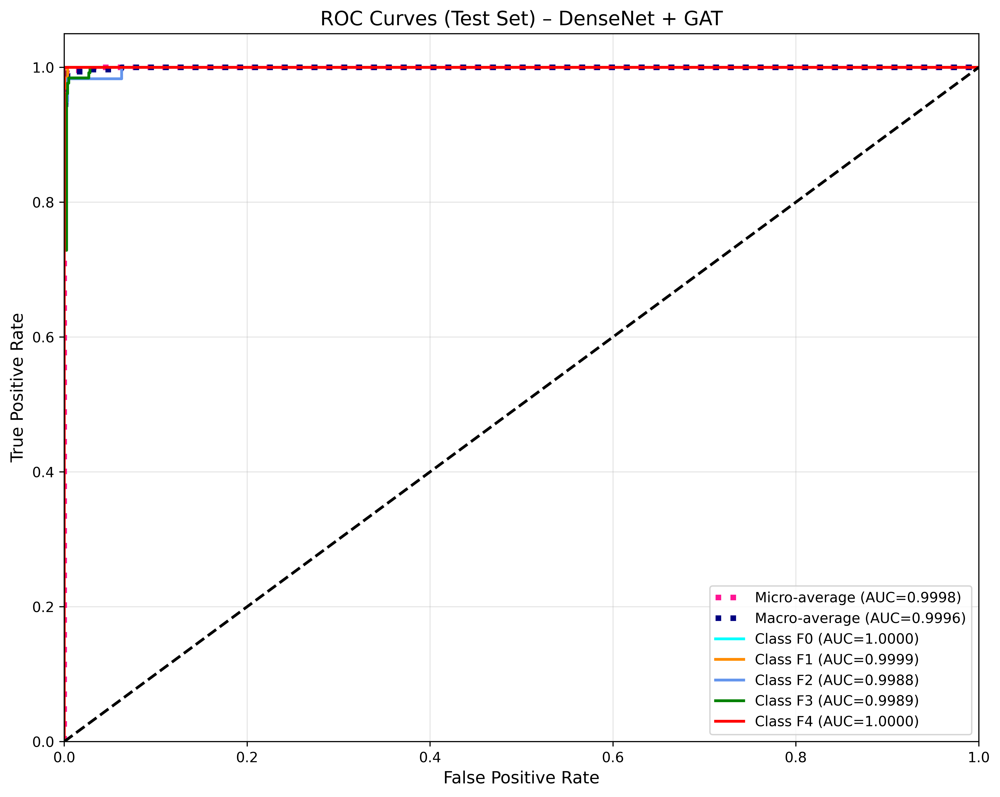

In [14]:
# --- CELL 11: ROC/AUC CURVES (DenseNet + GAT) — 600 DPI ---
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle
import numpy as np
import matplotlib.pyplot as plt

print("🚀 Generating ROC/AUC Curves (DenseNet + GAT)...")

# Safety check
if 'all_probs' not in locals() or 'all_labels' not in locals():
    print("❌ Error: Predictions not found. Please run TEST evaluation cell first!")
else:
    # 1. Binarize labels
    y_test = label_binarize(all_labels, classes=range(CFG.NUM_CLASSES))
    y_score = all_probs
    n_classes = y_test.shape[1]

    # 2. Compute ROC/AUC per class
    fpr, tpr, roc_auc = dict(), dict(), dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # 3. Micro-average ROC/AUC
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # 4. Macro-average ROC/AUC
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # 5. Print AUC values
    print(f"\n{'='*40}")
    print("📊 ROC/AUC RESULTS (TEST SET) — DenseNet + GAT")
    print(f"✅ Micro-average AUC: {roc_auc['micro']:.4f}")
    print(f"✅ Macro-average AUC: {roc_auc['macro']:.4f}")
    for i in range(n_classes):
        print(f"   - Class F{i} AUC: {roc_auc[i]:.4f}")
    print(f"{'='*40}")

    # 6. Plot ROC curves (600 DPI)
    fig = plt.figure(figsize=(10, 8), dpi=600)

    # Micro & Macro
    plt.plot(
        fpr["micro"], tpr["micro"],
        label=f'Micro-average (AUC={roc_auc["micro"]:.4f})',
        color='deeppink', linestyle=':', lw=4
    )

    plt.plot(
        fpr["macro"], tpr["macro"],
        label=f'Macro-average (AUC={roc_auc["macro"]:.4f})',
        color='navy', linestyle=':', lw=4
    )

    # Per-class ROC
    colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(
            fpr[i], tpr[i], color=color, lw=2,
            label=f'Class F{i} (AUC={roc_auc[i]:.4f})'
        )

    # Diagonal
    plt.plot([0, 1], [0, 1], 'k--', lw=2)

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title('ROC Curves (Test Set) – DenseNet + GAT', fontsize=14)
    plt.legend(loc="lower right", fontsize=10)
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    # OPTIONAL: save for paper
    fig.savefig(
        "roc_auc_densgat_test.png",
        dpi=600,
        bbox_inches="tight"
    )


Backbone channels: 1024
✅ Loaded Fold 1: densgat_fold1_best.pth
Backbone channels: 1024
✅ Loaded Fold 2: densgat_fold2_best.pth
Backbone channels: 1024
✅ Loaded Fold 3: densgat_fold3_best.pth

🔍 Testing: 1 random image from each class (F0–F4)...


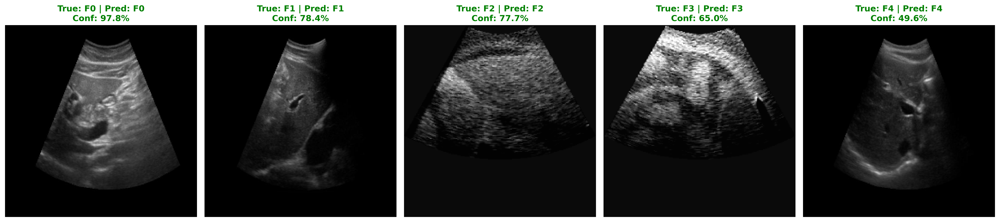

In [34]:
# --- CELL 12: ENSEMBLE INTERFACE TEST (DenseNet + GAT) ---
import os, gc
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F

class EnsembleGAT(nn.Module):
    def __init__(self):
        super().__init__()
        self.models = nn.ModuleList()

        torch.cuda.empty_cache()
        gc.collect()

        for i in range(3):
            p = f"densgat_fold{i+1}_best.pth"
            if os.path.exists(p):
                m = DenseNet_GAT(num_classes=CFG.NUM_CLASSES)
                m.load_state_dict(torch.load(p, map_location=CFG.DEVICE))
                m.to(CFG.DEVICE).eval()
                self.models.append(m)
                print(f"✅ Loaded Fold {i+1}: {p}")
            else:
                print(f"⚠️ Missing: {p}")

        if len(self.models) == 0:
            raise FileNotFoundError("❌ No fold model weights found. Check your file names/paths.")

    def forward(self, x):
        probs = [F.softmax(m(x), dim=1) for m in self.models]
        return torch.mean(torch.stack(probs), dim=0)

ensemble_gat = EnsembleGAT()

def get_true_label(row):
    """
    Robust true label extraction:
    - If diagnosis is 'F2' -> returns 2
    - If diagnosis is numeric -> returns int
    """
    y = row["diagnosis"] if "diagnosis" in row else row.diagnosis
    if isinstance(y, str):
        y = y.strip().upper()
        if y.startswith("F"):
            return int(y[1:])
        return int(float(y))
    return int(y)

def predict_one_per_class(df_data):
    print("\n🔍 Testing: 1 random image from each class (F0–F4)...")

    # pick one sample per class
    samples = []
    for c in range(CFG.NUM_CLASSES):
        sub = df_data[df_data["diagnosis"] == c] if isinstance(df_data["diagnosis"].iloc[0], (int, np.integer)) else df_data[df_data["diagnosis"].astype(str).str.contains(str(c))]
        if len(sub) == 0:
            print(f"⚠️ No samples found for class {c}")
            continue
        samples.append(sub.sample(1).iloc[0])

    n = len(samples)
    fig, axes = plt.subplots(1, n, figsize=(4*n, 5), dpi=300)
    if n == 1:
        axes = [axes]

    for i, row in enumerate(samples):
        img = cv2.imread(row["image_path"])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        rsz = cv2.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))

        t = valid_tfms(image=rsz)["image"].unsqueeze(0).to(CFG.DEVICE)

        with torch.no_grad():
            p = ensemble_gat(t)[0].detach().cpu().numpy()

        pred = int(np.argmax(p))
        conf = float(p[pred] * 100.0)
        true = get_true_label(row)

        col = 'green' if pred == true else 'red'

        axes[i].imshow(rsz)
        axes[i].set_title(
            f"True: F{true} | Pred: F{pred}\nConf: {conf:.1f}%",
            color=col, fontweight='bold'
        )
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Run on TEST set
predict_one_per_class(test_df)


🚀 Generating 6-Panel XAI for DenseNet121 + GAT...
Backbone channels: 1024

--- Class F0 ---


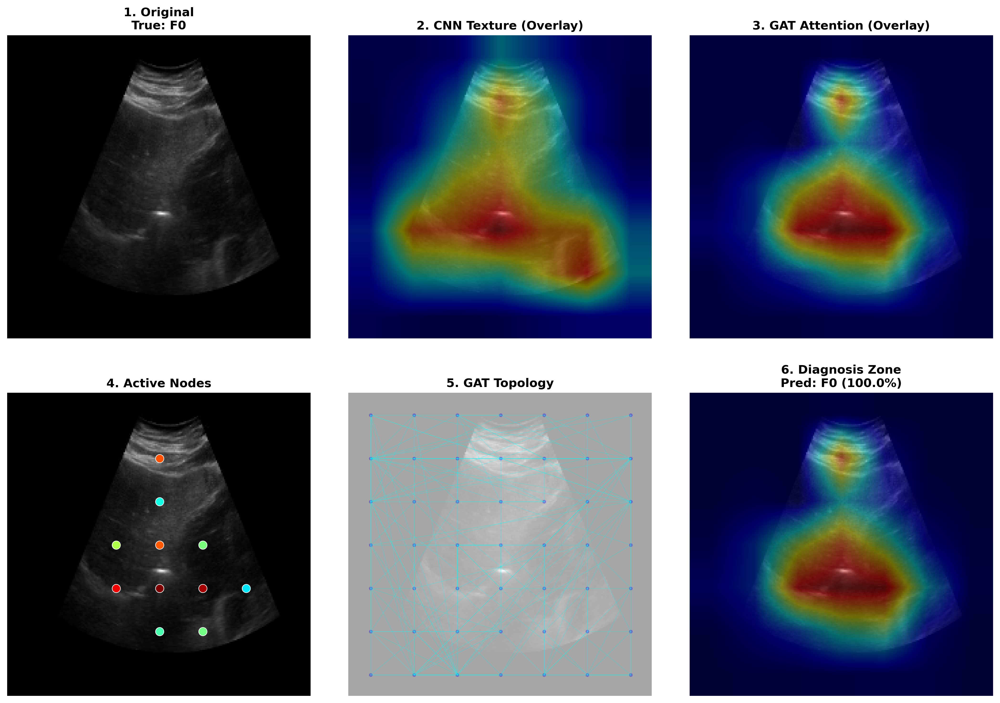


--- Class F1 ---


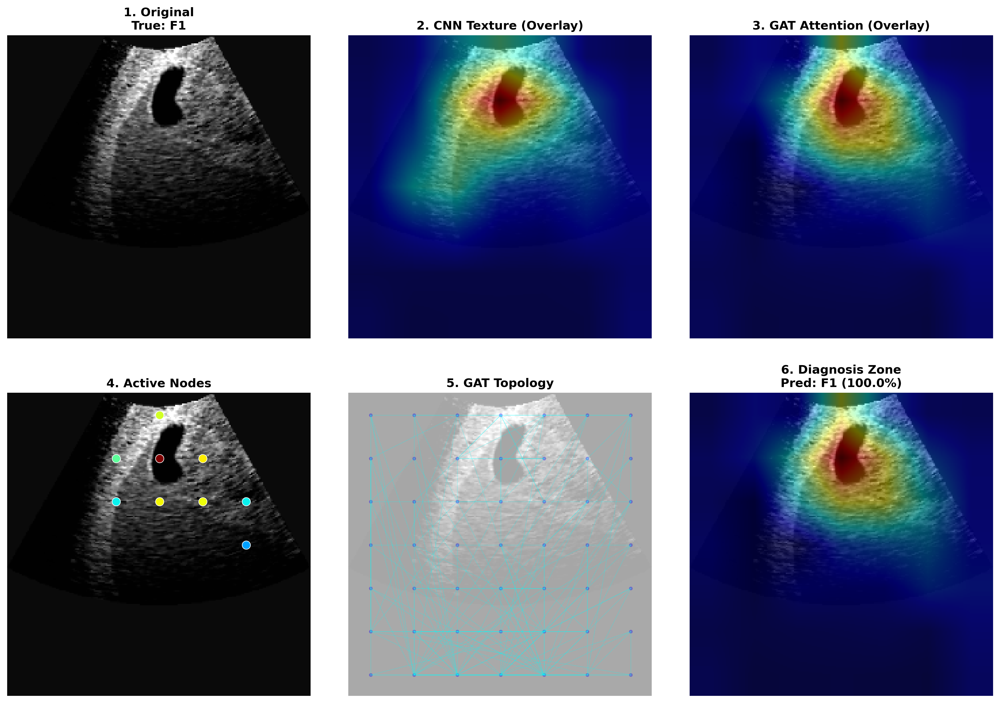


--- Class F2 ---


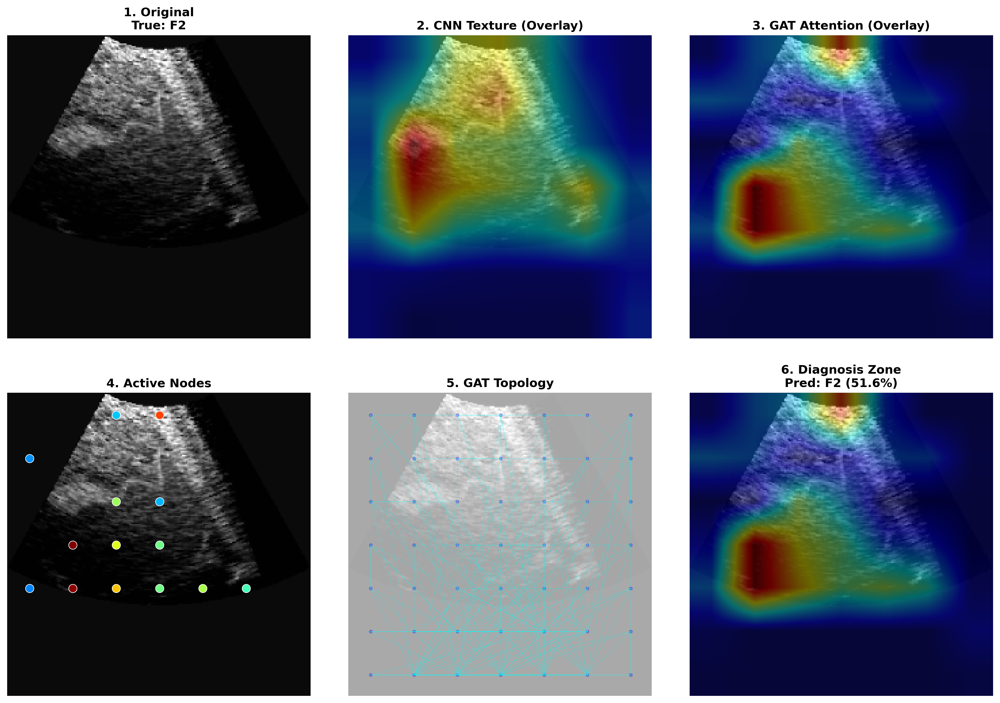


--- Class F3 ---


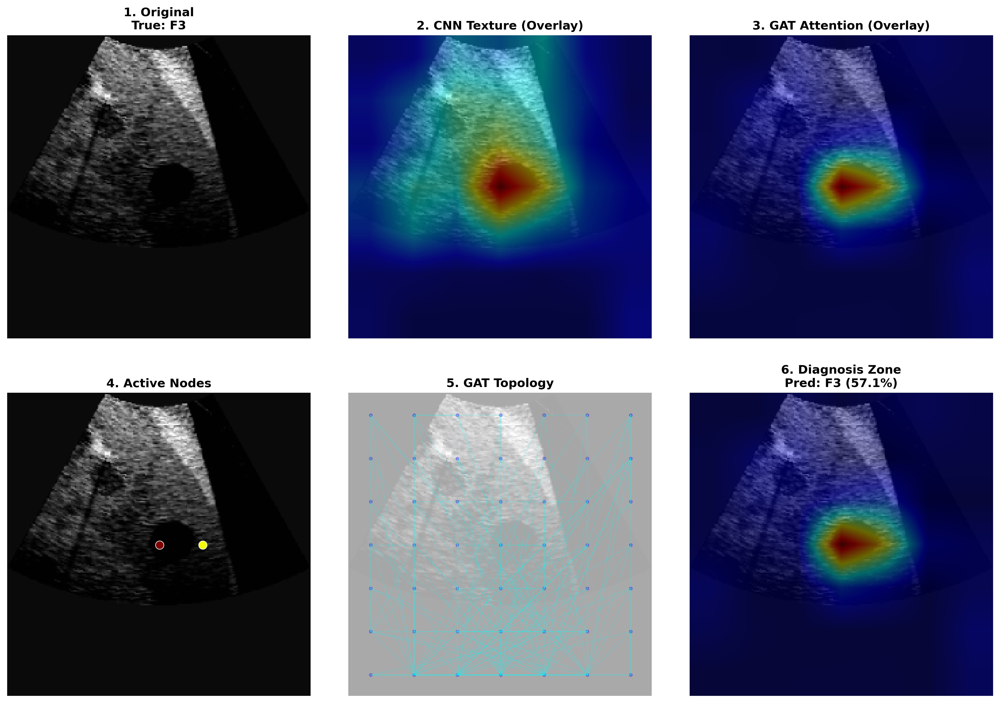


--- Class F4 ---


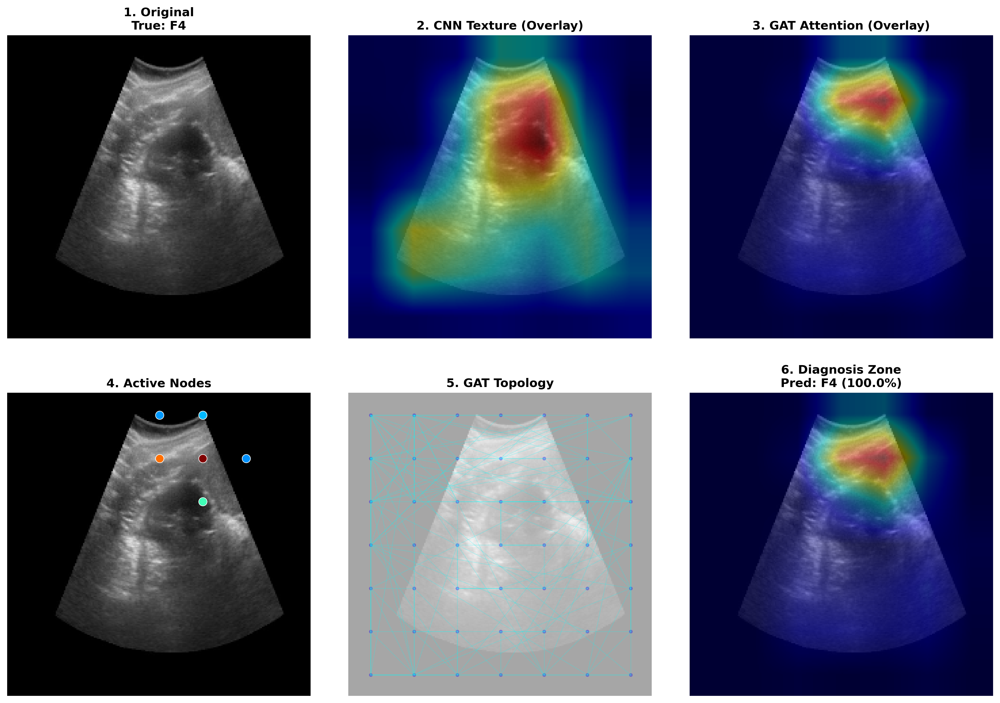

In [31]:
# --- CELL 13: 6-PANEL XAI VISUALIZATION (DenseNet + GAT) ---
print("🚀 Generating 6-Panel XAI for DenseNet121 + GAT...")

import cv2
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

# --------------------------------------------------
# 1) XAI EXTRACTION FUNCTION (GAT)
# --------------------------------------------------
def extract_gat_xai(model, img_tensor, true_label=None, default_k=8):
    model.eval()
    model.zero_grad()

    fmaps, grads = [], []

    def hook(module, input, output):
        fmap = output[-1] if isinstance(output, (list, tuple)) else output
        fmaps.append(fmap)
        fmap.register_hook(lambda g: grads.append(g))

    # Hook backbone feature maps
    h = model.backbone.register_forward_hook(hook)

    with torch.set_grad_enabled(True):
        logits = model(img_tensor)
        probs  = torch.softmax(logits, dim=1)
        pred   = logits.argmax(1).item()
        conf   = probs[0, pred].item()

        target = pred if true_label is None else true_label
        logits[0, target].backward()

    h.remove()

    # -------- Texture map --------
    fmap = fmaps[0].detach()  # [B, C, H, W]
    tex = torch.mean(fmap, dim=1).squeeze().cpu().numpy()
    tex = (tex - tex.min()) / (tex.max() - tex.min() + 1e-8)

    # -------- Attention map (Grad-CAM style) --------
    grad = grads[0].detach()
    w = torch.mean(grad, dim=(2, 3), keepdim=True)
    cam = torch.sum(w * fmap, dim=1).squeeze()
    cam = F.relu(cam).cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    # -------- Graph topology (nodes + edges) --------
    with torch.no_grad():
        C, H, W = fmap.shape[1:]
        flat = fmap[0].view(C, -1).permute(1, 0)  # [H*W, C]

        # choose k from model if available
        k = int(getattr(model, "k", default_k))
        k = max(1, min(k, flat.shape[0] - 1))  # safe clamp

        dist = torch.cdist(flat, flat)
        _, idx = dist.topk(k=k, largest=False)

        src = torch.arange(H * W, device=fmap.device).view(-1, 1).repeat(1, k).reshape(-1)
        dst = idx.reshape(-1)
        mask = src != dst
        edges = list(zip(src[mask].cpu().numpy(), dst[mask].cpu().numpy()))

        nodes = []
        for i in range(H * W):
            r, c = divmod(i, W)
            y = int((r + 0.5) * (CFG.IMG_SIZE / H))
            x = int((c + 0.5) * (CFG.IMG_SIZE / W))
            nodes.append((x, y))

    return tex, cam, nodes, edges, pred, conf


# --------------------------------------------------
# 2) HELPER: OVERLAY HEATMAP ON IMAGE
# --------------------------------------------------
def overlay_heatmap_on_image(img_rgb, heatmap_01, alpha=0.45, colormap=cv2.COLORMAP_JET):
    heat = np.uint8(255 * heatmap_01)
    heat_color = cv2.applyColorMap(heat, colormap)  # BGR
    heat_color = cv2.cvtColor(heat_color, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(img_rgb, 1 - alpha, heat_color, alpha, 0)
    return overlay


# --------------------------------------------------
# 3) PLOTTING FUNCTION (TRUE + PRED LABELS)
# --------------------------------------------------
def plot_gat_6_panel(img, tex, cam, nodes, edges, true_y, pred_y, conf, dpi=300):
    fig, ax = plt.subplots(2, 3, figsize=(18, 12), dpi=dpi)
    plt.subplots_adjust(wspace=0.08, hspace=0.18)

    sz = (CFG.IMG_SIZE, CFG.IMG_SIZE)
    tex_rs = cv2.resize(tex, sz)
    cam_rs = cv2.resize(cam, sz)

    tex_overlay  = overlay_heatmap_on_image(img, tex_rs, alpha=0.45, colormap=cv2.COLORMAP_JET)
    cam_overlay  = overlay_heatmap_on_image(img, cam_rs, alpha=0.45, colormap=cv2.COLORMAP_JET)
    diag_overlay = overlay_heatmap_on_image(img, cam_rs, alpha=0.40, colormap=cv2.COLORMAP_JET)

    font = {'weight': 'bold', 'size': 12}

    # 1) Original
    ax[0, 0].imshow(img)
    ax[0, 0].set_title(f"1. Original\nTrue: F{true_y}", font)

    # 2) Texture overlay
    ax[0, 1].imshow(tex_overlay)
    ax[0, 1].set_title("2. CNN Texture (Overlay)", font)

    # 3) Attention overlay
    ax[0, 2].imshow(cam_overlay)
    ax[0, 2].set_title("3. GAT Attention (Overlay)", font)

    # 4) Active nodes
    ax[1, 0].imshow(img)
    flat = cam.flatten()
    for i, (nx, ny) in enumerate(nodes):
        if i < len(flat) and flat[i] > 0.25:
            ax[1, 0].scatter(nx, ny, c=[plt.cm.jet(flat[i])],
                             s=70, edgecolors='w', linewidths=0.6, zorder=2)
    ax[1, 0].set_title("4. Active Nodes", font)

    # 5) Topology
    ax[1, 1].imshow(img, alpha=0.35)
    for i, (s, d) in enumerate(edges):
        if i % 2 == 0:  # downsample edges
            x1, y1 = nodes[s]
            x2, y2 = nodes[d]
            ax[1, 1].plot([x1, x2], [y1, y2], c='cyan', alpha=0.25, lw=0.6)
    for nx, ny in nodes:
        ax[1, 1].scatter(nx, ny, c='blue', s=8, alpha=0.25)
    ax[1, 1].set_title("5. GAT Topology", font)

    # 6) Diagnosis overlay + prediction
    ax[1, 2].imshow(diag_overlay)
    ax[1, 2].set_title(f"6. Diagnosis Zone\nPred: F{pred_y} ({conf*100:.1f}%)", font)

    for a in ax.flatten():
        a.axis('off')

    plt.show()


# --------------------------------------------------
# 4) RUN XAI EXAMPLES (TRUE + PRED)
# --------------------------------------------------
model = DenseNet_GAT(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)
model.load_state_dict(torch.load("densgat_fold1_best.pth", map_location=CFG.DEVICE))
model.eval()

for c in range(CFG.NUM_CLASSES):
    subset = test_df[test_df.diagnosis == c]

    if len(subset) == 0:
        continue

    print(f"\n--- Class F{c} ---")
    row = subset.sample(1).iloc[0]

    img = cv2.cvtColor(cv2.imread(row.image_path), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))

    t = valid_tfms(image=img)["image"].unsqueeze(0).to(CFG.DEVICE)

    tex, cam, nodes, edges, pred, conf = extract_gat_xai(model, t, true_label=c)

    # set dpi=600 if you want publication export quality
    plot_gat_6_panel(img, tex, cam, nodes, edges, true_y=c, pred_y=pred, conf=conf, dpi=300)
